# <center>" AML 2203 - Advanced Python AI and ML Tools "</center>

[ask prashanta to use the avialble dataframe and work, please](#10)

<a id="0"></a> 
# Project - Analysis of building a Recommendation System with text data (content based )


### Group Members

- Aishlee C0913045
- Guruprasad Tandlekar C0902813
- Jayachandhran Saravanan C0910392
- Prashanta Timsina C0916254
- Rohan Aryan C0912902
- Yogita Sharma C0913011

### Dataset and Onedrive links :

The following are the one-drive links of,

- __Dataset :__
- __Whole working folder :__
- __Github :__ https://github.com/svjai/AML_2203_project


# Table of Contents



#### [Data_scrapping](#)

#### [Data Validation](#)
#### [Data Validation_text_data](#)
#### [Data Wrangling](#)
#### [Visualization_(mining_insights)](#)
#### [pre-processing](#)
#### [word_embedding_model](#)
#### [model_2](#)
#### [price_prediction_1](#)
#### [post_model_analysis](#)
#### [Inference](#)






<a id="1"></a> 
## Data_Scarpping

The datascrapping is done using the API technique and the max limitation cap for scrapping is acheived on particular IP, therefore proxy route table is used to fetch the data.

All the scrapped data can be found here: https://github.com/svjai/AML_2203_project/tree/main/project/data

The book data scrapped for this project contains TEXT, NUMERIC and BINARY data types with 16 feature columns. Following domains are taken into consideration : "business, mindfulness, and computer" (Artificial Intelligence / AI, network, User Interface / UI, Databases / DB, languages, etc) based books data.

In [8]:
# importing the required libraries 




import nltk
import pandas as pd                          
import numpy as np                          
import matplotlib.pyplot as plt             
import seaborn as sns                       
import re                                   
from PIL import Image                        
from wordcloud import WordCloud, STOPWORDS  
import nltk                                  
from nltk.corpus import stopwords            
from nltk.tokenize import word_tokenize     
from textblob import TextBlob               
import emoji                                 
import unicodedata                          
import warnings                             
warnings.filterwarnings('ignore')   
import logging
from IPython.display import display

from collections import Counter
from nltk.stem import WordNetLemmatizer
import string
from sklearn.manifold import TSNE
import tqdm
from nltk.tokenize import sent_tokenize
from gensim.models import word2vec
from gensim.models.word2vec import Word2Vec
import plotly.express as px
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
# from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import SMOTE # for SMOTE technique

from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder

from nltk.stem import WordNetLemmatizer
from nltk.tokenize import RegexpTokenizer


<a id="2"></a> 
## Data_validation
- first understanding the data 
- the non-text fields are validated followed by text data
- missing values, duplicate values and outliers are checked
- correlation and pandas profiling is done to get more insights on the data 

In [9]:
# load the dataset from the 'csv' file
df = pd.read_csv("scrapped_data_version_1_comp_business_mind.csv")

In [10]:
# display the first and last 5 records of the dataset
display(df.head())
display(df.tail())

,Book_title,book_id,book_price,author_name(s),publisher_name,publication_year,sub_title_book,book_edition,description,book_availablity,date_of_sale,year_month,author_count,common_width,common_heighy,category_verification
0,Software Engineering at Google,209970024,71.99,Titus Winters,O'Reilly Media,2020,Lessons Learned from Programming Over Time,NaN,"Today, software engineers need to know not onl...",True,2020-02-28T00:00:00,Feb 2020,3,97,150,arch
1,The Software Architect Elevator,209997033,71.99,Gregor Hohpe,O'Reilly Media,2020,Redefining the Architect's Role in the Digital...,NaN,As the digital economy changes the rules of th...,True,2020-04-08T00:00:00,Apr 2020,1,97,150,arch
2,Software Architecture Metrics,210567692,71.99,Christian Ciceri,O'Reilly Media,2022,NaN,NaN,Software architecture metrics are key to the m...,True,2022-05-18T00:00:00,May 2022,10,97,150,arch
3,Designing Hexagonal Architecture with Java,211106723,46.99,Davi Vieira,Packt Publishing,2023,Build maintainable and long-lasting applicatio...,NaN,NaN,True,2023-09-29T00:00:00,Sep 2023,1,97,150,arch
4,OpenStack for Architects,96237030,44.99,Michael Solberg,Packt Publishing,2018,Design production-ready private cloud infrastr...,NaN,NaN,True,2018-05-31T00:00:00,May 2018,2,97,150,arch


,Book_title,book_id,book_price,author_name(s),publisher_name,publication_year,sub_title_book,book_edition,description,book_availablity,date_of_sale,year_month,author_count,common_width,common_heighy,category_verification
43050,Mindful Metamorphosis,210845308,5.99,Schalin,New Degree Press,2023,A Compassionate Guide to Inner Transformation,NaN,Unlocking your potential has never been easier...,True,2023-05-10T00:00:00,May 2023,1,97,150,info_mindful
43051,Beautiful Women: A View from the Heart,210845546,6.99,Charlie Garland,New Degree Press,2023,Stories of Inspiration to Help Mend a Torn World,NaN,Beautiful Women: A View from the Heart contain...,True,2023-05-11T00:00:00,May 2023,1,97,150,info_mindful
43052,Feminine Reclaimed,210809341,6.99,Michele Wong,New Degree Press,2023,A Memoir,NaN,There comes a point in everyone's life where w...,True,2023-03-24T00:00:00,Mar 2023,1,97,150,info_mindful
43053,Celtic Mythology,210770637,3.99,Adam Andino,Rivercat Books LLC,2023,Tales From the Celtic Pantheon,NaN,"CELTIC MYTHOLOGY ""Celtic Mythology: Tales from...",True,2023-02-15T00:00:00,Feb 2023,1,97,150,info_mindful
43054,Discover & Use Your Greatest Superpower,210845836,13.99,Carina Marshall,New Degree Press,2023,NaN,NaN,This book introduces you to an extended identi...,True,2023-05-12T00:00:00,May 2023,1,97,150,info_mindful


In [11]:
def validation(df):
    
    """
    arg: df --> dataframe to check the data and validate the data features
    func: analyse the data parameters and display the characteristics using various methods
    return: display all the basic data validation
    """
    
    print("shape of the data: {} \n number of rows {}\n number of columns {}".format(df.shape,df.shape[0],df.shape[1]))
    print("="*60)
    b_color = "\033[0m"
    color = "\033[95m"
    print(color + "\n*** Information of the Dataset ***\n" + b_color)
    print(df.info())
    print("="*60)
    
   
    color = "\033[38;2;139;69;19m"
    print(color + '\n*** Columns in Dataframe ***\n\n' + b_color, df.columns)
    print("="*60)
    
    # checking for null or missing values
    color = "\033[94m"
    print(color + "\n*** Null values in the Dataset ***\n" + b_color)
    print(df.isnull().sum())
    print("="*60)
    print(df.isnull().mean()*100)
    print("="*60)
    
    
    # find the duplicate rows in the dataset
    print(f'\033[0mNumber of duplicate entries in the dataset are: \033[94m{df.duplicated().sum()}')
    print("="*60)
    
    
    # firstly, know the numerical and categorical columns from the dataset

    num_features = [i for i in df.columns if df[i].dtypes != 'O']
    cat_features = [j for j in df.columns if df[j].dtypes == 'O']
    print("\033[95mNumber of Numerical Features: \033[0m", len(num_features))
    print("\033[91m\nNumerical Features: \033[0m", end = '')
    print(num_features)
    print("\n\033[95mNumber of Categorical Features: \033[0m", len(cat_features))
    print("\033[91m\nCategorical Features: \033[0m", end = '')
    print(cat_features)
    print("="*60)

In [12]:
## keeping the data copy for redudance 

df_red=df.copy()

In [13]:
validation(df)

shape of the data: (43055, 16) 
 number of rows 43055
 number of columns 16

*** Information of the Dataset ***

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43055 entries, 0 to 43054
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Book_title             43055 non-null  object 
 1   book_id                43055 non-null  int64  
 2   book_price             42776 non-null  float64
 3   author_name(s)         43044 non-null  object 
 4   publisher_name         43055 non-null  object 
 5   publication_year       43055 non-null  int64  
 6   sub_title_book         30499 non-null  object 
 7   book_edition           3398 non-null   object 
 8   description            38031 non-null  object 
 9   book_availablity       43055 non-null  bool   
 10  date_of_sale           43055 non-null  object 
 11  year_month             43055 non-null  object 
 12  author_count           43055 non-null  int64 

<a id="3"></a> 
## data_understanding

Each entry in the dataset corresponds to a unique book entry, corresponding to various attributes such as book ID, book title, author name, description, publisher, edition, etc. The features provided for each record include:

- __Book_title:__ the title of a book
- __book_id:__ an unique identifier for each book in the dataset
- __book_price:__ the price of the particular book
- __author_name(s):__ the name(s) of the author(s) of the particular book
- __publisher_name:__ the name of the publisher of the book
- __publisher_year:__ the year when the book was published
- __sub_title_book:__ the subtitle of the book, if any
- __book_edition:__ the edition of the book, if applicable
- __description:__ a detailed description oor summary of the book
- __book_availability:__ ivailability status of the book, whether a book is in stock or not.
- __date_of_sale:__ the date when the book was sold
- __year_month:__ year and month of the sale
- __author_count:__ the count of authors associated with the books
- __common_width:__ width dimension of the book (in cm)
- __common_height:__ height dimension of the book (in cm)
- __category_verification:__ verification status of the book category 

<a id="4"></a> 
## Inference_1

- the validation of the data shows few missing values and duplicated records
- Data type of the columns are mismatched and need to process the date columns and the binary columns
- equal amount of numerical and categorical columns are present 
- the unique values of the categorical values need to be analysed, similarly the outliers for the numeric values need to tested
- feature selection based on the signifance need to be justified
- missing values of columns book_price,author_name(s),sub_title_book,book_edition,description are found --> sub_title and the book edition has more than missing counts with percentange of 30% and 92
- 788 records are founded repeatative --> inspection needed thought the percentage is less than 2%

In [14]:
# datatyoe of the date based columns are handles 

df['updated_date_column'] = pd.to_datetime(df['date_of_sale'])
df['updated_month']=df['updated_date_column'].dt.month
df['updated_date']=df['updated_date_column'].dt.day

In [15]:
def analysis_cat(df):
    """
    arg: dataframe to check the charcter of the catgorical columns 
    func: analysis of unique values (varience in the columns), number of unique values
    return: 
    """
    cat_analysis=[]
    cat_columns=df.select_dtypes(include='object').columns
    for cat in cat_columns:
        print("analysing the column {}".format(cat))
        
        temp_unique_values=df[cat].unique()
        count_of_unique_values=df[cat].nunique()
        print("number of unique values :{}".format(count_of_unique_values))
        print(temp_unique_values)
        cat_analysis.append({f'{cat}:{count_of_unique_values}'})
        
    return cat_analysis

In [16]:
cat_analysi_raw=analysis_cat(df)

analysing the column Book_title
number of unique values :35443
['Software Engineering at Google' 'The Software Architect Elevator'
 'Software Architecture Metrics' ... 'Feminine Reclaimed'
 'Celtic Mythology' 'Discover & Use Your Greatest Superpower']
analysing the column author_name(s)
number of unique values :27985
['Titus Winters' 'Gregor Hohpe' 'Christian Ciceri' ... 'Michele Wong'
 'Adam Andino' 'Carina Marshall']
analysing the column publisher_name
number of unique values :908
["O'Reilly Media" 'Packt Publishing' 'Pearson Education'
 'Addison-Wesley Longman' 'Elsevier Science' 'Wiley' 'Pragmatic Bookshelf'
 'CRC Press' 'Springer Nature Singapore' 'BPB Publications' 'IOS Press'
 'Taylor and Francis' 'Taylor & Francis' 'Princeton University Press'
 'World Scientific Publishing Company' 'Apress'
 'Springer International Publishing' 'Springer Berlin Heidelberg'
 'Springer New York' 'Springer US' 'No Starch Press'
 'Springer Netherlands' 'Springer London'
 'BCS Learning & Development 

In [17]:
cat_analysi_raw

[{'Book_title:35443'},
 {'author_name(s):27985'},
 {'publisher_name:908'},
 {'sub_title_book:27406'},
 {'book_edition:20'},
 {'description:35948'},
 {'date_of_sale:6991'},
 {'year_month:461'},
 {'category_verification:11'}]

In [18]:
def numeric_analysi(df):
    """
    arg:data frame
    function: analysis the numeric values
    """
    num_analysis=[]
    num_columns=df.select_dtypes(include=[np.number]).columns
    stats_num=df[list(num_columns)].describe([.1,.25,.50,.75,.9]).T
    for num in num_columns:
        print("analysi of the numeric column {}".format(num))
        skew=df[num].skew()
        kurtosis=df[num].kurtosis()
        rang_=df[num].max()-df[num].min()
        iqr=df[num].quantile(.75)-df[num].quantile(.25)
        num_analysis.append({"{}".format(num):{'skew':skew,'kurtosis':kurtosis,'range':rang_,'inter_quartile':iqr}})
    return stats_num,num_analysis

In [19]:
stat,distributuin=numeric_analysi(df)

analysi of the numeric column book_id
analysi of the numeric column book_price
analysi of the numeric column publication_year
analysi of the numeric column author_count
analysi of the numeric column common_width
analysi of the numeric column common_heighy
analysi of the numeric column updated_month
analysi of the numeric column updated_date


In [20]:
stat

,count,mean,std,min,10%,25%,50%,75%,90%,max
book_id,43055.0,9.776120e+07,9.629440e+07,102073.0,602828.20,1576804.50,9.579747e+07,2.101831e+08,2.107387e+08,2.112693e+08
book_price,42776.0,6.522971e+01,5.848166e+01,0.0,9.99,23.99,5.495535e+01,7.542209e+01,1.323370e+02,2.367576e+03
publication_year,43055.0,2.013356e+03,2.170085e+01,1753.0,2007.00,2011.00,2.016000e+03,2.020000e+03,2.022000e+03,2.025000e+03
author_count,43055.0,1.956614e+00,1.592760e+00,0.0,1.00,1.00,1.000000e+00,2.000000e+00,4.000000e+00,5.900000e+01
common_width,43055.0,9.700000e+01,0.000000e+00,97.0,97.00,97.00,9.700000e+01,9.700000e+01,9.700000e+01,9.700000e+01
common_heighy,43055.0,1.500000e+02,0.000000e+00,150.0,150.00,150.00,1.500000e+02,1.500000e+02,1.500000e+02,1.500000e+02
updated_month,43055.0,6.822274e+00,3.460842e+00,1.0,2.00,4.00,7.000000e+00,1.000000e+01,1.200000e+01,1.200000e+01
updated_date,43055.0,1.601531e+01,9.473793e+00,1.0,3.00,7.00,1.600000e+01,2.500000e+01,2.900000e+01,3.100000e+01


In [21]:
distributuin

[{'book_id': {'skew': 0.16234071726577987,
   'kurtosis': -1.807035325605966,
   'range': 211167216,
   'inter_quartile': 208606326.5}},
 {'book_price': {'skew': 4.05410576050624,
   'kurtosis': 77.66920459931839,
   'range': 2367.576485,
   'inter_quartile': 51.43208672}},
 {'publication_year': {'skew': -10.896430387024832,
   'kurtosis': 127.29231031246155,
   'range': 272,
   'inter_quartile': 9.0}},
 {'author_count': {'skew': 5.868031056852699,
   'kurtosis': 114.87235724204194,
   'range': 59,
   'inter_quartile': 1.0}},
 {'common_width': {'skew': 0,
   'kurtosis': 0,
   'range': 0,
   'inter_quartile': 0.0}},
 {'common_heighy': {'skew': 0,
   'kurtosis': 0,
   'range': 0,
   'inter_quartile': 0.0}},
 {'updated_month': {'skew': -0.11390342007232404,
   'kurtosis': -1.1915411207152253,
   'range': 11,
   'inter_quartile': 6.0}},
 {'updated_date': {'skew': -0.01852118192709003,
   'kurtosis': -1.2959700023456855,
   'range': 30,
   'inter_quartile': 18.0}}]

In [22]:
def date_analysis(df,col):
    """
    arg : df --> dataframer
    arg: col --> date columns only
    function: finding the maximum and minimum date values
    return
    """
    date_=[]
    min_date=df[col].min()
    max_date=df[col].max()
    min_year=min_date.year
    max_year=max_date.year
    num_days=df[col].nunique()
    return ({"oldes_date":min_date,"latest_date":max_date,"old_year":min_year,"recent":max_year})
    

In [23]:
date_analysis(df,'updated_date_column')

{'oldes_date': Timestamp('1753-01-01 00:00:00'),
 'latest_date': Timestamp('2025-03-04 00:00:00'),
 'old_year': 1753,
 'recent': 2025}

<a id="5"></a> 
## Inference_2

### category
- the analysis of the categorical values give clear picture on the values present in the each categories and the varience with the value counts are calculated 
- 27K+ authors are found
- more than 900 publishers
- the editions of thr books are going till 20

### numeric
- the numeric analysis of the data is done on the note of finding the outliers and the distribution of the data in the given data
- the columns like common height, common_width,book_id are not significant
- the book price --> one of the indirect target varible is showing positive sknewness with heavy tail
- the date fields are showing negative skewness of the date columns

### date

- the date analysis gives the clear understanding of the date outliers with clear distinguhising 

In [24]:
df = df.drop_duplicates()

In [25]:
df_before=df.copy()

<a id="6"></a> 
## text_processing

In [26]:
df['description'] = df['description'].fillna('')

In [27]:
def counts_(tok):
    word_=nltk.word_tokenize(tok)
    word_count=len(nltk.word_tokenize(tok))
    sent_count=len(nltk.sent_tokenize(tok))
    stopwords_=set(stopwords.words('english'))
    stp_count=sum(1 for i in word_ if i.lower() in stopwords_)
    spl_count=sum(1 for j in tok if j in set(string.punctuation) )
    return word_count, sent_count, stp_count, spl_count
    


In [28]:
df['word_count'], df['sent_count'], df['stp_count'], df['spl_count'] = zip(*df['description'].apply(counts_))
print(df.head())  # Display the DataFrame with added columns

                                   Book_title    book_id  book_price  \
0              Software Engineering at Google  209970024       71.99   
1             The Software Architect Elevator  209997033       71.99   
2               Software Architecture Metrics  210567692       71.99   
3  Designing Hexagonal Architecture with Java  211106723       46.99   
4                    OpenStack for Architects   96237030       44.99   

     author_name(s)    publisher_name  publication_year  \
0     Titus Winters    O'Reilly Media              2020   
1      Gregor Hohpe    O'Reilly Media              2020   
2  Christian Ciceri    O'Reilly Media              2022   
3       Davi Vieira  Packt Publishing              2023   
4   Michael Solberg  Packt Publishing              2018   

                                      sub_title_book book_edition  \
0         Lessons Learned from Programming Over Time          NaN   
1  Redefining the Architect's Role in the Digital...          NaN   
2    

In [29]:
df

,Book_title,book_id,book_price,author_name(s),publisher_name,publication_year,sub_title_book,book_edition,description,book_availablity,...,common_width,common_heighy,category_verification,updated_date_column,updated_month,updated_date,word_count,sent_count,stp_count,spl_count
0,Software Engineering at Google,209970024,71.99,Titus Winters,O'Reilly Media,2020,Lessons Learned from Programming Over Time,NaN,"Today, software engineers need to know not onl...",True,...,97,150,arch,2020-02-28,2,28,54,3,21,6
1,The Software Architect Elevator,209997033,71.99,Gregor Hohpe,O'Reilly Media,2020,Redefining the Architect's Role in the Digital...,NaN,As the digital economy changes the rules of th...,True,...,97,150,arch,2020-04-08,4,8,58,3,22,7
2,Software Architecture Metrics,210567692,71.99,Christian Ciceri,O'Reilly Media,2022,NaN,NaN,Software architecture metrics are key to the m...,True,...,97,150,arch,2022-05-18,5,18,52,2,19,6
3,Designing Hexagonal Architecture with Java,211106723,46.99,Davi Vieira,Packt Publishing,2023,Build maintainable and long-lasting applicatio...,NaN,,True,...,97,150,arch,2023-09-29,9,29,0,0,0,0
4,OpenStack for Architects,96237030,44.99,Michael Solberg,Packt Publishing,2018,Design production-ready private cloud infrastr...,NaN,,True,...,97,150,arch,2018-05-31,5,31,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43050,Mindful Metamorphosis,210845308,5.99,Schalin,New Degree Press,2023,A Compassionate Guide to Inner Transformation,NaN,Unlocking your potential has never been easier...,True,...,97,150,info_mindful,2023-05-10,5,10,60,4,21,13
43051,Beautiful Women: A View from the Heart,210845546,6.99,Charlie Garland,New Degree Press,2023,Stories of Inspiration to Help Mend a Torn World,NaN,Beautiful Women: A View from the Heart contain...,True,...,97,150,info_mindful,2023-05-11,5,11,64,2,23,15
43052,Feminine Reclaimed,210809341,6.99,Michele Wong,New Degree Press,2023,A Memoir,NaN,There comes a point in everyone's life where w...,True,...,97,150,info_mindful,2023-03-24,3,24,70,4,30,12
43053,Celtic Mythology,210770637,3.99,Adam Andino,Rivercat Books LLC,2023,Tales From the Celtic Pantheon,NaN,"CELTIC MYTHOLOGY ""Celtic Mythology: Tales from...",True,...,97,150,info_mindful,2023-02-15,2,15,65,3,25,11


In [30]:
class TextPreprocessor:
    def __init__(self):
        pass
    @staticmethod
    def remove_stopwords(df, column):
        s_words = list(stopwords.words('english'))
        extra_s = ["what", "us", "this", "well", "there", "much", "us", "and", "you're", "in", "where", "when", "just", "how",
                   "is", "ha", "re", "are", "hi", "aren't", 'couldn', 'could', 'couldnt', "couldn't", 'did', 'had', 'have',
                   'must', 'does', 'should', 'was', "it's", "didn't", "doesn't", "don't", "hadn't", "hasn't", "haven't",
                   "isn't", 'let', 'll', "may", 'were', 'is', 'has', 'must', 'mustn', 'rt', 'shan', 'shouldn', 'wasn', 'weren',
                   'httpstco', 'PAW PAW', 'PAW', 'won', 'wouldn','realli', 'now', 'got', 'man', 'people', 'a', "i", "he's",
                   'becaus','caus',"one","im","guy","someone","two",'read', "nearby", "she's","we","it","they","wouldn’t","i've",
                   'publications', 'publication','aren', 'didn', 'doesn', 'don','amazon','good', 'content', 'hadn', 'hasn','star', 'haven',
                   'isn','great', 'subscription', 'sdidn', 've','article','subscribe', 'articles',"will","magazine","magazines","author",
                   'writer','review','pages','issue','document',"httpstco",'PAW PAW','PAW']

        stop_words = list(STOPWORDS) + list(s_words) + list(extra_s)

        df[column] = df[column].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in stop_words]))
    @staticmethod
    def word_cloud(text):
        s_words = list(stopwords.words('english'))
        extra_s = ["what", "us", "this","well","there","much","us","and","you're","in","where","when","just","how","is","ha","re","are",
                   "hi","aren't", 'couldn','could','couldnt',"couldn't",'did','had','have','must','does','should','was',"it's",
                   "didn't", "doesn't", "don't", "hadn't", "hasn't", "haven't", "isn't", 'let', 'll',"may",'were','is','has','must',
                   'mustn', 'rt', 'shan', 'shouldn', 'wasn', 'weren','httpstco','PAW PAW','PAW', 'won', 'wouldn','realli','now','got','man','people','a',
                   'becaus','caus',"one","im","guy","someone","two",'read', "nearby","i","he's","she's","we","it","they","wouldn’t","i've",
                   'publications', 'publication','aren', 'didn', 'doesn', 'don','amazon','good', 'content', 'hadn', 'hasn','star', 'haven',
                   'isn','great', 'subscription', 'sdidn', 've','article','subscribe', 'articles',"will","magazine","magazines","author",
                   'writer','review','pages','issue','document',"httpstco",'PAW PAW','PAW']

        stop_words = list(STOPWORDS) + list(s_words) + list(extra_s)

        word_cloud = WordCloud(width = 750, height = 550,
                               background_color = 'white',
                               stopwords = stop_words,
                               min_font_size = 12).generate_from_text(text)

        plt.figure(figsize = (8, 6))
        plt.imshow(word_cloud)
        plt.axis("off")
        plt.show()

    @staticmethod
    def lemmatize(df, column):
        df[column] = df[column].apply(lambda x: ''.join([nltk.WordNetLemmatizer().lemmatize(word) for word in x]))
    @staticmethod
    def remove_emoji(df, column):
        df[column] = df[column].apply(lambda x: ' '.join([emoji.replace_emoji(word, replace = '') for word in x.split()]))
    @staticmethod
    def punctuator(df, column):
        df[column] = df[column].apply(lambda x: str(x).translate(str.maketrans('', '', string.punctuation)))
    @staticmethod
    def remove_digits(df, column):
        df[column] = df[column].apply(lambda x: ' '.join(''.join(char if char.isalpha() or char.isspace() else ' ' for char in word) for word in str(x).split()))
    @staticmethod
    def remove_meaningless(df, column):
        df[column] = df[column].apply(lambda x: ' '.join([str(TextBlob(word).correct()) for word in x.split()]))
    @staticmethod
    # Function to check alphabet recurring more than twice
    def remove_len(df, column):
        p = re.compile(r'(.)\1{2,}')
        df[column] = df[column].apply(lambda x: ' '.join([p.sub('',word) for word in x.split()]))
    @staticmethod
    def remove_urls (df, column):
        p = re.compile(r'(https|http)?:\/\/(\w|\.|\/|\?|\=|\&|\%)*\b')
        df[column] = df[column].apply(lambda x: ' '.join([p.sub('',word) for word in x.split()]))

In [31]:
text_processor = TextPreprocessor()
df['Processed_description'] = df['description']
text_processor.remove_len(df, 'Processed_description')
text_processor.remove_stopwords(df, 'Processed_description')
text_processor.lemmatize(df, 'Processed_description')
text_processor.remove_emoji(df, 'Processed_description')
text_processor.punctuator(df, 'Processed_description')
text_processor.remove_digits(df, 'Processed_description')
text_processor.remove_urls(df, 'Processed_description')

In [32]:
df['Processed_description'].head(10)

0    Today software engineers need know program eff...
1    digital economy changes rules game enterprises...
2    Software architecture metrics key maintainabil...
3                                                     
4                                                     
5    ONEVOLUME INTRODUCTION QUANTUM COMPUTING Clear...
6    learn book software developer looking quick on...
7    you re looking develop native applications Kub...
8                                                     
9    PCI Express System Architecture provides indep...
Name: Processed_description, dtype: object

<a id="6"></a> 
## visualisation Insights 

<Figure size 1500x1000 with 0 Axes>

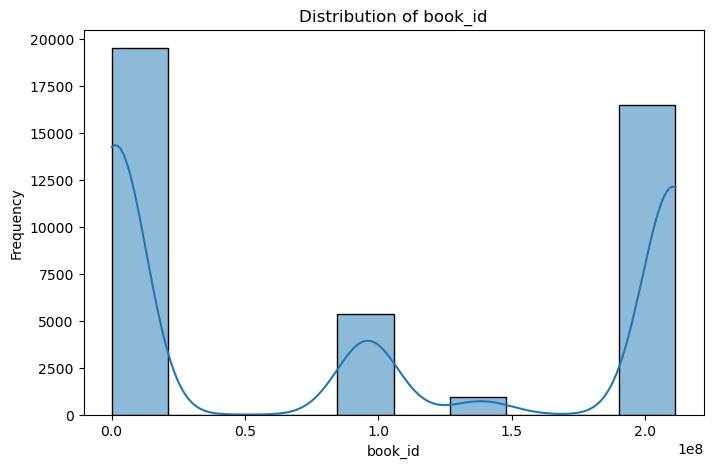

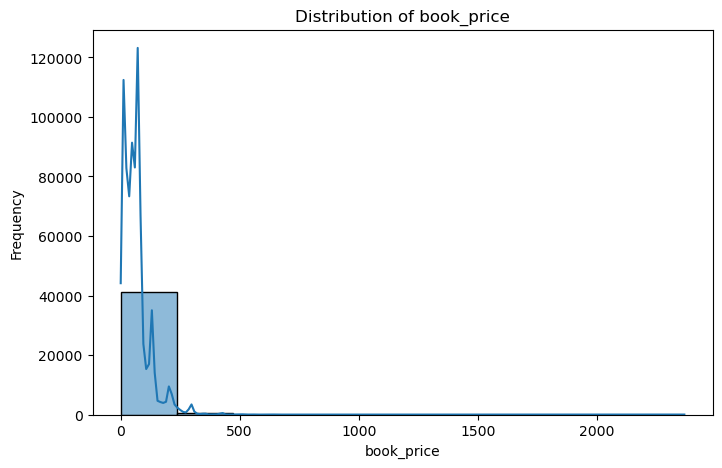

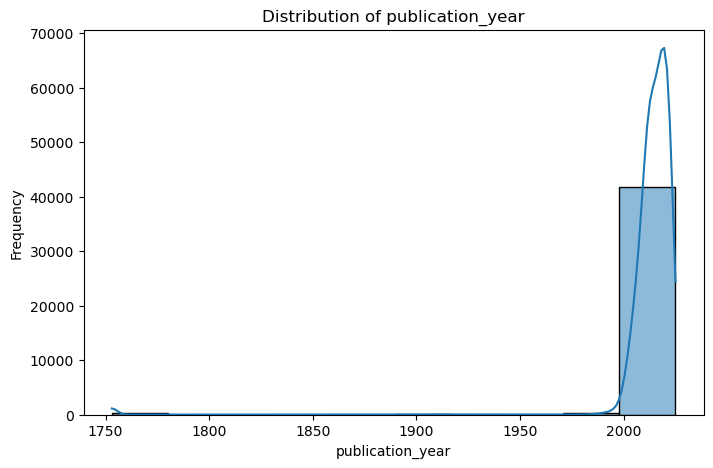

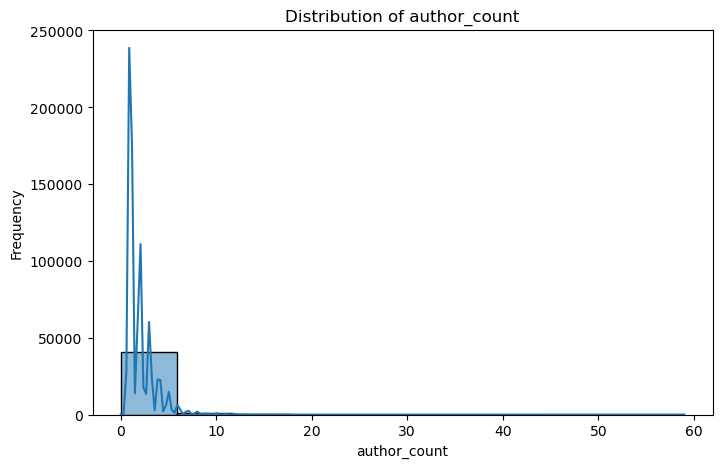

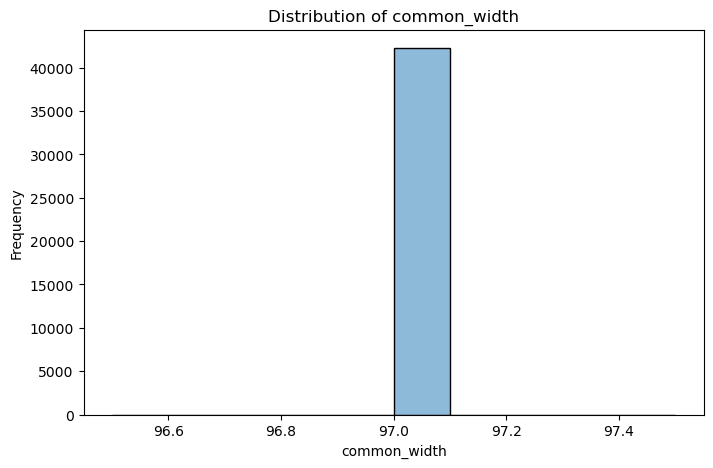

...

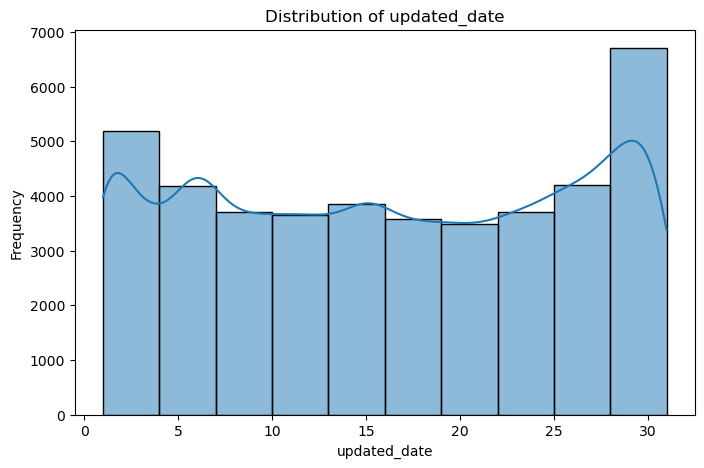

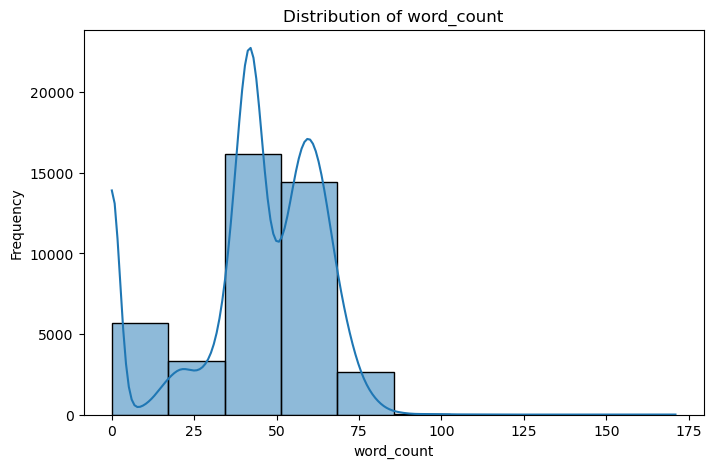

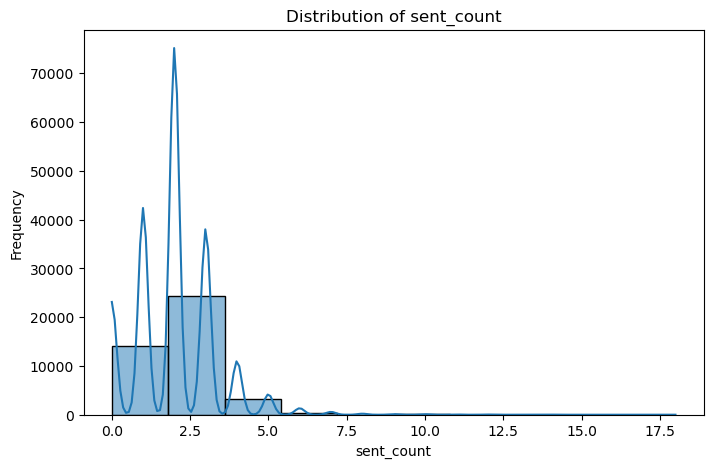

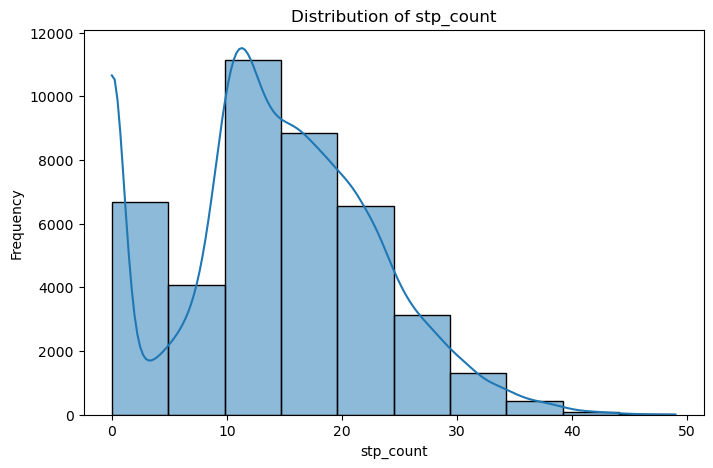

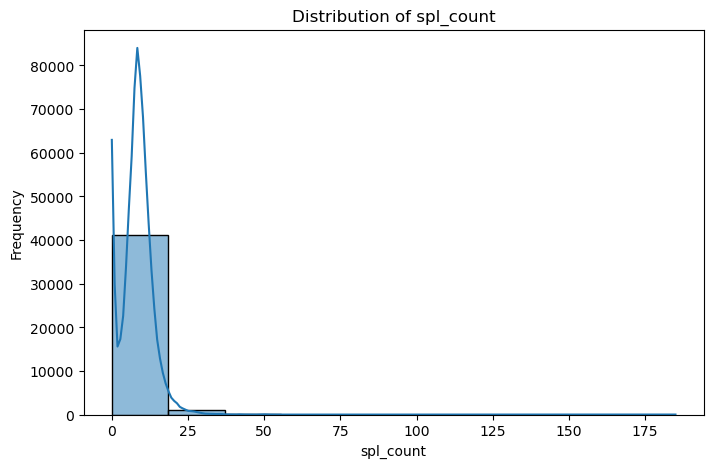

In [33]:
# Distribution of numerical variables
num_features = df.select_dtypes(include = ['int64', 'float64']).columns
for i in num_features:
    plt.figure(figsize = (8, 5))
    sns.histplot(df[i], bins = 10, kde = True)
    plt.title(f'Distribution of {i}')
    plt.xlabel(i)
    plt.ylabel('Frequency')
    plt.show()

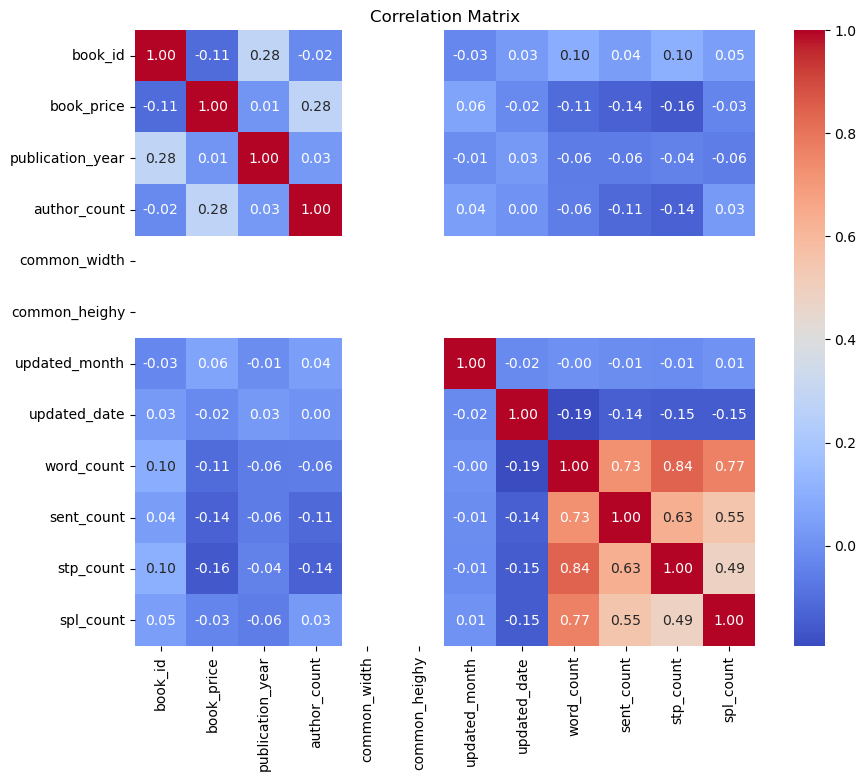

In [34]:
# Correlation analysis
num_features = df.select_dtypes(include=['float64', 'int64'])
plt.figure(figsize = (10, 8))
sns.heatmap(num_features.corr(), annot = True, cmap = 'coolwarm', fmt = ".2f")
plt.title('Correlation Matrix')
plt.show()

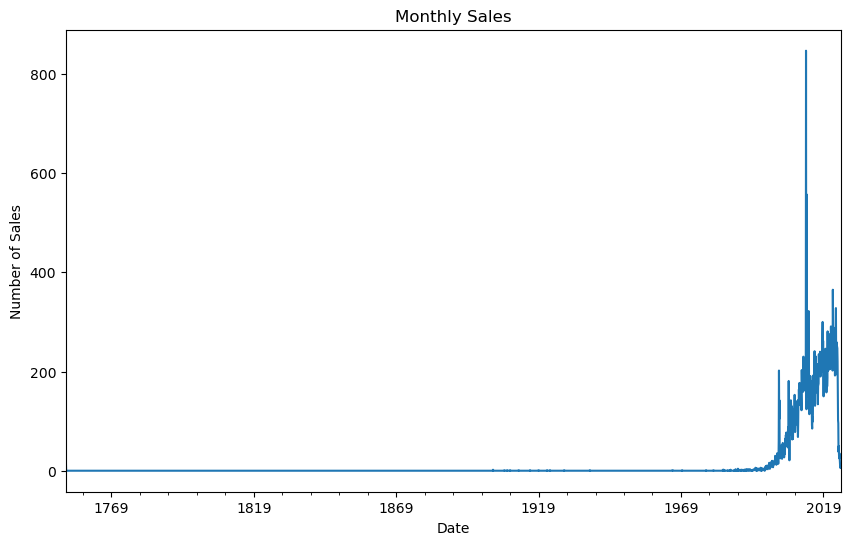

In [35]:
# Time Series Analysis
df['date_of_sale'] = pd.to_datetime(df['date_of_sale'])
df.set_index('date_of_sale', inplace = True)
plt.figure(figsize = (10, 6))
df.resample('M').size().plot()
plt.title('Monthly Sales')
plt.xlabel('Date')
plt.ylabel('Number of Sales')
plt.show()

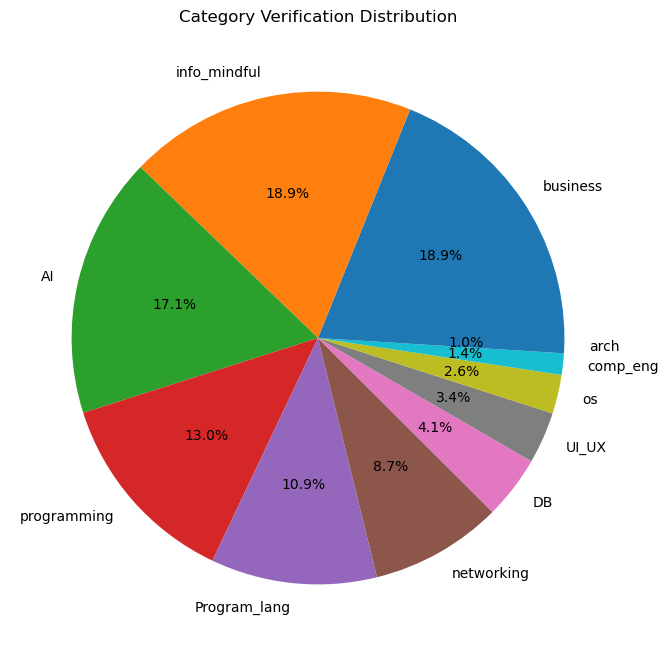

In [36]:
# Pie Charts
plt.figure(figsize = (8, 8))
df['category_verification'].value_counts().plot(kind = 'pie', autopct = '%1.1f%%')
plt.title('Category Verification Distribution')
plt.ylabel('')
plt.show()

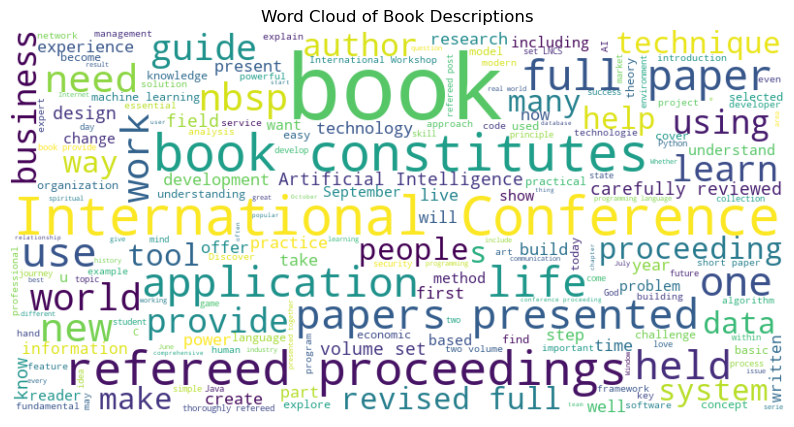

In [37]:
# Word Clouds (for description column)
from wordcloud import WordCloud
text = ' '.join(df['description'].dropna())
wordcloud = WordCloud(width = 800, height = 400, background_color = 'white').generate(text)
plt.figure(figsize = (10, 6))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.title('Word Cloud of Book Descriptions')
plt.axis('off')
plt.show()

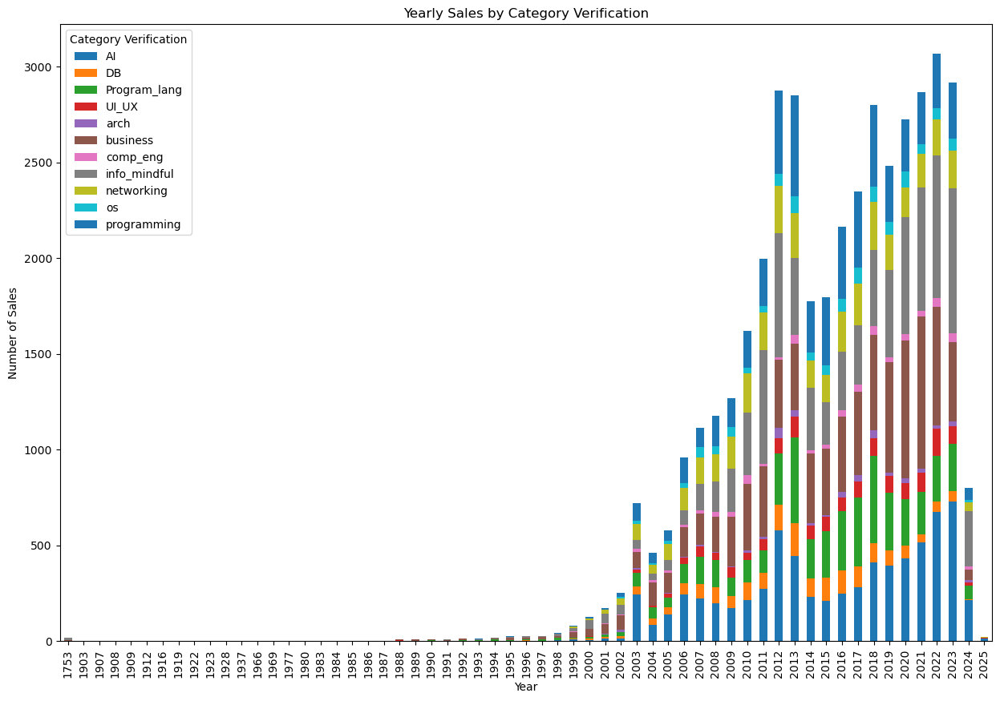

In [38]:
# Stacked Bar Plots
year_sales = df.groupby([df.index.year, 'category_verification']).size().unstack(fill_value = 0)
year_sales.plot(kind = 'bar', stacked = True, figsize = (15, 10))
plt.title('Yearly Sales by Category Verification')
plt.xlabel('Year')
plt.ylabel('Number of Sales')
plt.legend(title='Category Verification')
plt.show()

In [39]:
# Function to preprocess text and extract words
def preprocess_text(text):
    if isinstance(text, str):
        processed_text = text.lower().split()
        return processed_text
    else:
        return []

In [40]:
# Count the frequency of words for each category and author
c_freq = {}
a_freq = {}

In [41]:
from collections import Counter

In [42]:
for i, r in df.iterrows():
    category = r['category_verification']
    author = r['author_name(s)']
    text = r['Processed_description']
    words = preprocess_text(text)

    # count word frequency for each 'category'
    if category not in c_freq:
        c_freq[category] = Counter()
    c_freq[category] += Counter(words)

    # count word frequency for each 'author'
    if author not in a_freq:
        a_freq[author] = Counter()
    a_freq[author] += Counter(words)

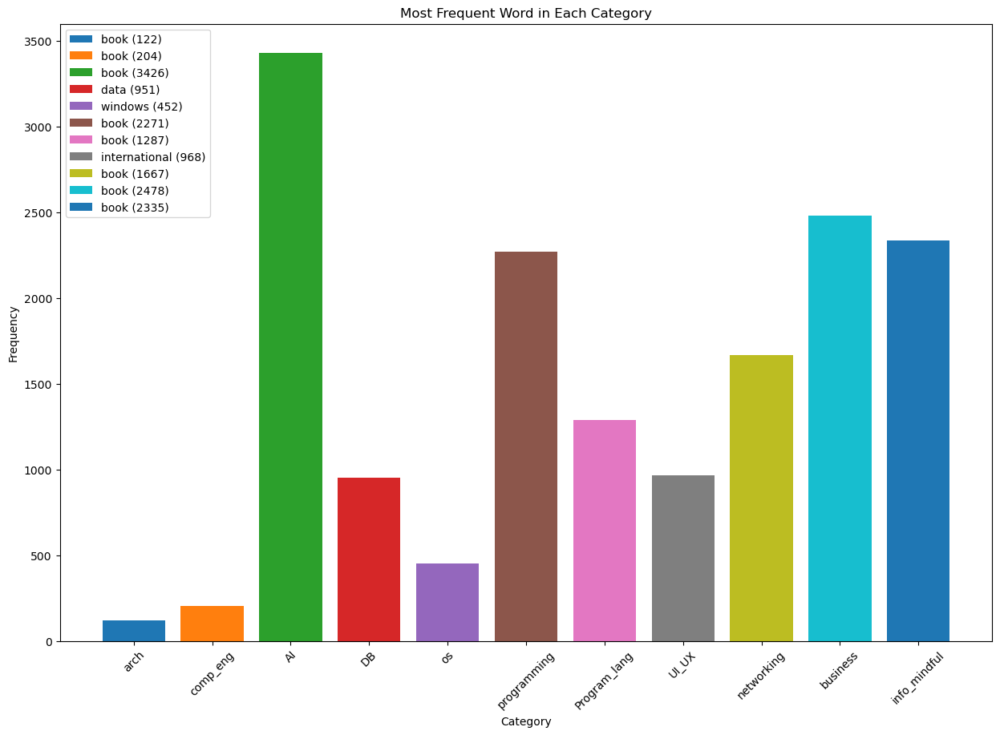

In [43]:
# lets plot the most frequent word in each category
plt.figure(figsize = (15, 10))
for category, word_freq in c_freq.items():
    most_common_word, freq = word_freq.most_common(1)[0]
    plt.bar(category, freq, label = f"{most_common_word} ({freq})")
plt.title('Most Frequent Word in Each Category')
plt.xlabel('Category')
plt.ylabel('Frequency')
plt.legend()
plt.xticks(rotation = 45)
plt.show()

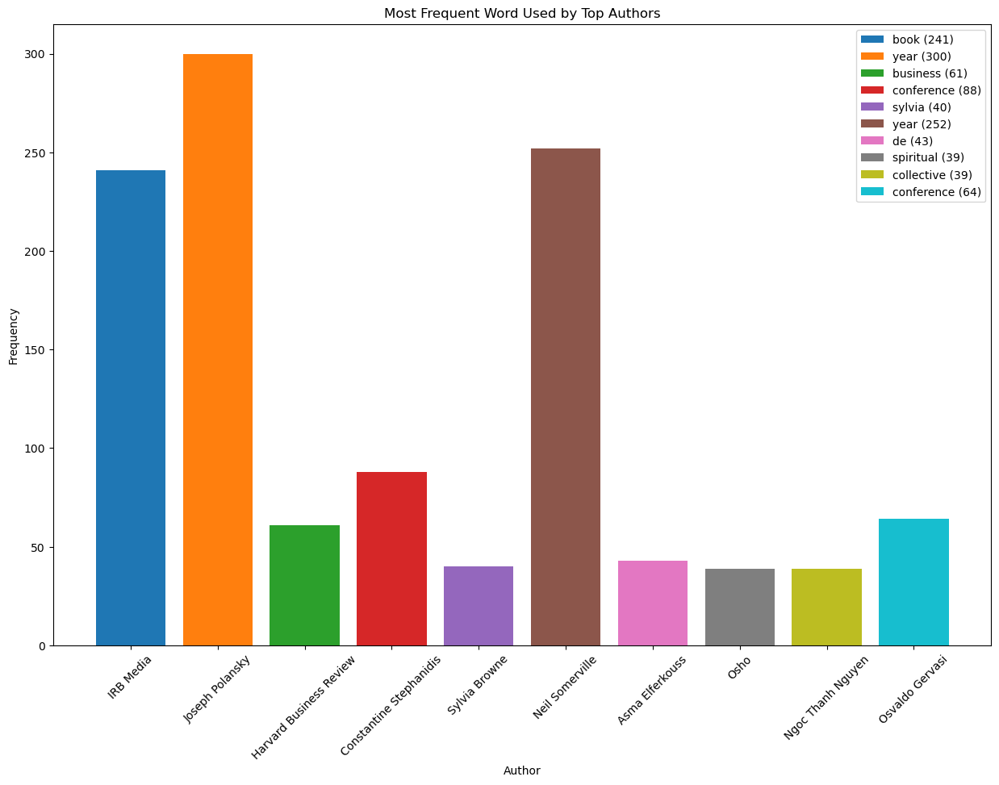

In [44]:
# now, plot the most frequent word used by each author (limiting to top N authors)
plt.figure(figsize = (15, 10))
top_n_authors = 10
for author, word_freq in sorted(a_freq.items(), key = lambda x: sum(x[1].values()), reverse = True)[:top_n_authors]:
    most_common_word, frequency = word_freq.most_common(1)[0]
    plt.bar(author, frequency, label = f"{most_common_word} ({frequency})")
plt.title('Most Frequent Word Used by Top Authors')
plt.xlabel('Author')
plt.ylabel('Frequency')
plt.legend()
plt.xticks(rotation = 45)
plt.show()

In [45]:
# Group by category_verification and count the number of occurrences
cat_counts = df['category_verification'].value_counts().reset_index()
cat_counts.columns = ['category_verification', 'count']

# Create the bar plot using Plotly Express
fig = px.bar(cat_counts, x = 'category_verification', y = 'count',
             title = 'Count of Books per Category',
             labels = {'category_verification': 'Category', 'count': 'Count'},
             color = 'category_verification')
fig.show()

In [46]:
fig = px.scatter(df, x = 'publication_year', y = 'book_price', title = 'Book Price vs Publication Year',
                 labels = {'publication_year': 'Publication Year', 'book_price': 'Book Price'},
                 color = 'category_verification')
fig.show()

In [47]:
# # select few numerical columns for pairplot
# num_columns = ['book_price', 'publication_year', 'author_count']
# # lets create a pairplot
# sns.pairplot(df, hue = 'category_verification', vars = num_columns)
# plt.show()

In [48]:
from scipy import stats

In [49]:
def qq_plot(data, variable):
    fig = px.scatter(x = np.sort(data[variable]), y = np.sort(np.random.normal(np.mean(data[variable]), np.std(data[variable]), len(data))),
                     labels = {'x': 'Theoretical Quantiles', 'y': 'Sample Quantiles'}, title=f'QQ Plot for {variable}')

In [50]:
# now, creating scatter plot matrix with QQ plots
def scatter_plot_matrix_with_qq(df):
    fig = px.scatter_matrix(df, dimensions = ['book_price', 'publication_year', 'author_count'],
                            labels = {'book_price': 'Book Price', 'publication_year': 'Publication Year', 'author_count': 'Author Count'})
    for variable in ['book_price', 'publication_year', 'author_count']:
        qq_plot(df, variable)
    fig.update_layout(title = 'Scatter Plot Matrix with QQ Plots')
    fig.show()
scatter_plot_matrix_with_qq(df)

In [51]:
# create a 3D scatter plot for the relationship between publication year, book price, and author count
fig = px.scatter_3d(df, x = 'publication_year', y = 'book_price', z = 'author_count', title = '3D Scatter Plot')
fig.show()

In [52]:
df_before_1=df.copy()

<a id="8"></a> 
## text processing

In [53]:
df_red1=df_red.copy()

In [54]:
df=df_red1

In [55]:
df = df[['Book_title','sub_title_book','description']]

if we dont want to drop these records, we can impute them with a random value to retain as much information as possible about the book.

Later approaches can also be using pre-trained models and paraphrase the data in hand to generate custom sub titles, or descriptions in the same way

In [56]:
df.fillna('UNK', inplace=True) # UNK for unknown

In [57]:
# merging the features to have a final column for corpus
df['merged_TSD'] = df['Book_title'] + ' ' + df['sub_title_book']+ ' ' + df['description']
df.head()

,Book_title,sub_title_book,description,merged_TSD
0,Software Engineering at Google,Lessons Learned from Programming Over Time,"Today, software engineers need to know not onl...",Software Engineering at Google Lessons Learned...
1,The Software Architect Elevator,Redefining the Architect's Role in the Digital...,As the digital economy changes the rules of th...,The Software Architect Elevator Redefining the...
2,Software Architecture Metrics,UNK,Software architecture metrics are key to the m...,Software Architecture Metrics UNK Software arc...
3,Designing Hexagonal Architecture with Java,Build maintainable and long-lasting applicatio...,UNK,Designing Hexagonal Architecture with Java Bui...
4,OpenStack for Architects,Design production-ready private cloud infrastr...,UNK,OpenStack for Architects Design production-rea...


In [58]:
# defining functions for each task

def lower_case(text): 
    return text.lower()

def remove_punctuations(text):
    no_punc_text = text.translate(str.maketrans('','',string.punctuation))
    return no_punc_text

def tokenize(text):
    return word_tokenize(text)

def remove_stopwords(text):
    stopset = set(stopwords.words('english'))
    return [word for word in text if word not in stopset]

def lemmatize_text(tokens):
    lemmer = WordNetLemmatizer()
    return [lemmer.lemmatize(word) if lemmer.lemmatize(word) is not None else word for word in tokens]

def remove_special_characters(tokens):
    return [re.sub('[^A-Za-z]+', '', word) for word in tokens]

In [59]:
def preprocess_data(text):
    '''
    To Preprocess the data in one execution.
    
    follows all the disciplines of textual preprocessing in NLP
    '''
    
    text = lower_case(text) # lower the text
    clean_text = remove_punctuations(text) # clean the text 
    tokens = tokenize(text) # tokenization
    clean_tokens = remove_stopwords(tokens) # stopwords removal
    lemmas = lemmatize_text(clean_tokens) # lemmatization 
    final = remove_special_characters(lemmas) # removing special characters
    return ' '.join(final)

In [60]:
preprocess_data(df['merged_TSD'][0]) # testing

'software engineering google lesson learned programming time today  software engineer need know program effectively also develop proper engineering practice make codebase sustainable healthy  book emphasizes difference programming software engineering  software engineer manage living codebase evolves responds '

In [61]:
df['processed_TSD'] = df['merged_TSD'].apply(preprocess_data)

In [62]:
df['processed_TSD'].head()

0    software engineering google lesson learned pro...
1    software architect elevator redefining archite...
2    software architecture metric unk software arch...
3    designing hexagonal architecture java build ma...
4    openstack architect design productionready pri...
Name: processed_TSD, dtype: object

In [63]:
df

,Book_title,sub_title_book,description,merged_TSD,processed_TSD
0,Software Engineering at Google,Lessons Learned from Programming Over Time,"Today, software engineers need to know not onl...",Software Engineering at Google Lessons Learned...,software engineering google lesson learned pro...
1,The Software Architect Elevator,Redefining the Architect's Role in the Digital...,As the digital economy changes the rules of th...,The Software Architect Elevator Redefining the...,software architect elevator redefining archite...
2,Software Architecture Metrics,UNK,Software architecture metrics are key to the m...,Software Architecture Metrics UNK Software arc...,software architecture metric unk software arch...
3,Designing Hexagonal Architecture with Java,Build maintainable and long-lasting applicatio...,UNK,Designing Hexagonal Architecture with Java Bui...,designing hexagonal architecture java build ma...
4,OpenStack for Architects,Design production-ready private cloud infrastr...,UNK,OpenStack for Architects Design production-rea...,openstack architect design productionready pri...
...,...,...,...,...,...
43050,Mindful Metamorphosis,A Compassionate Guide to Inner Transformation,Unlocking your potential has never been easier...,Mindful Metamorphosis A Compassionate Guide to...,mindful metamorphosis compassionate guide inne...
43051,Beautiful Women: A View from the Heart,Stories of Inspiration to Help Mend a Torn World,Beautiful Women: A View from the Heart contain...,Beautiful Women: A View from the Heart Stories...,beautiful woman view heart story inspiration ...
43052,Feminine Reclaimed,A Memoir,There comes a point in everyone's life where w...,Feminine Reclaimed A Memoir There comes a poin...,feminine reclaimed memoir come point everyone ...
43053,Celtic Mythology,Tales From the Celtic Pantheon,"CELTIC MYTHOLOGY ""Celtic Mythology: Tales from...",Celtic Mythology Tales From the Celtic Pantheo...,celtic mythology tale celtic pantheon celtic m...


In [64]:
# exporting the processed dataset
# df.to_csv('pre_processed_data.csv',index_label=False)

In [65]:
corpus = df['processed_TSD'].tolist()

In [66]:
tokens = [doc.split() for doc in corpus]

In [67]:
# training the model
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)
model = Word2Vec(sentences=tokens,
                 window = 10,
                 size=150,
                 min_count=3,
                iter=50)

2024-04-15 00:25:46,063 : WARNING : consider setting layer size to a multiple of 4 for greater performance
2024-04-15 00:25:46,064 : INFO : collecting all words and their counts
2024-04-15 00:25:46,065 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2024-04-15 00:25:46,114 : INFO : PROGRESS: at sentence #10000, processed 320611 words, keeping 17658 word types
2024-04-15 00:25:46,158 : INFO : PROGRESS: at sentence #20000, processed 610484 words, keeping 28542 word types
2024-04-15 00:25:46,217 : INFO : PROGRESS: at sentence #30000, processed 927250 words, keeping 39541 word types
2024-04-15 00:25:46,279 : INFO : PROGRESS: at sentence #40000, processed 1251312 words, keeping 52677 word types
2024-04-15 00:25:46,299 : INFO : collected 60463 word types from a corpus of 1363742 raw words and 43055 sentences
2024-04-15 00:25:46,299 : INFO : Loading a fresh vocabulary
2024-04-15 00:25:46,342 : INFO : effective_min_count=3 retains 21996 unique words (36% of original 

In [68]:
# testing the vectorization
model.wv['python']

array([ 2.57245302e-01,  1.28075445e+00, -1.21210277e+00,  2.73097277e+00,
       -1.59402728e+00, -8.85107696e-01, -1.15047383e+00, -1.98069954e+00,
       -4.72481400e-01, -1.10192096e+00,  1.28085840e+00, -2.70348048e+00,
        3.29719126e-01,  1.23100970e-02,  2.67985672e-01, -6.52283907e-01,
        2.78630662e+00, -2.15853572e+00,  1.06329238e+00,  1.35153845e-01,
        6.86299086e-01,  1.02446653e-01, -1.21636188e+00,  3.09105188e-01,
       -1.47575152e+00, -9.85202968e-01, -2.01703206e-01,  2.59550571e+00,
        1.81235492e+00,  4.31996679e+00,  4.09296560e+00,  2.03358322e-01,
        1.38599086e+00, -5.82874155e+00,  5.58884025e-01,  1.17119658e+00,
       -9.40317094e-01,  3.82413054e+00, -1.83900725e-02,  1.54489267e+00,
        3.46324563e+00, -4.22703695e+00, -1.24713385e+00,  3.97002792e+00,
       -2.46587253e+00, -5.73761284e-01, -9.26455796e-01,  7.10941732e-01,
        3.07856703e+00, -5.14571369e-01,  2.84604764e+00,  1.10667360e+00,
       -3.88527942e+00,  

In [69]:
model.wv.most_similar('python') # Checking the most similar words

2024-04-15 00:26:48,226 : INFO : precomputing L2-norms of word weight vectors


[('panda', 0.42118197679519653),
 ('numpy', 0.4175420105457306),
 ('scipy', 0.4045962691307068),
 ('handson', 0.39408087730407715),
 ('chatgpt', 0.3907031714916229),
 ('jupyter', 0.39068475365638733),
 ('r', 0.38798412680625916),
 ('pythonbased', 0.38653364777565),
 ('java', 0.3800295889377594),
 ('javascript', 0.37923577427864075)]

In [70]:
# list of keys (words) that have been vectorized and stored in the model
model.wv.index2entity 

['unk',
 'book',
 'international',
 'conference',
 'proceeding',
 'th',
 'application',
 'guide',
 'system',
 'paper',
 'held',
 's',
 'data',
 'new',
 'constitutes',
 'life',
 'programming',
 'learning',
 'development',
 'revised',
 'network',
 'intelligence',
 'using',
 'refereed',
 'business',
 'world',
 'technology',
 'design',
 'full',
 'computer',
 'computing',
 'practical',
 'management',
 'part',
 'workshop',
 'learn',
 'nbsp',
 'artificial',
 'one',
 'language',
 'information',
 'selected',
 'presented',
 'edition',
 'work',
 'technique',
 'time',
 'volume',
 'web',
 'need',
 'first',
 'research',
 'practice',
 'september',
 'game',
 'approach',
 'c',
 'use',
 'science',
 'machine',
 'year',
 'way',
 'theory',
 'author',
 'provides',
 'help',
 'build',
 'power',
 'tool',
 'set',
 'analysis',
 'python',
 'knowledge',
 'software',
 'database',
 'de',
 'algorithm',
 'many',
 'people',
 'java',
 'make',
 'present',
 'get',
 'introduction',
 'experience',
 'july',
 'ai',
 'problem'

In [71]:
# creating a dictionary to represent word and vector in K:v format
word_embeddings = {}

for word in model.wv.index2entity:
    vector = model.wv.get_vector(word)
    word_embeddings[word] = vector

In [72]:
# dictionary of word->vector format
# search this dictionary if you want to inspect any words ---> remove this comment later.
word_embeddings

{'unk': array([-4.6601277e-02, -3.8744149e-01, -3.1197093e+00,  3.3048263e+00,
        -1.1318945e+00, -4.7469795e-01, -1.7018397e+00,  7.3852140e-01,
        -1.9336454e+00,  3.8577709e-01,  1.3541203e+00, -1.6271822e+00,
         2.2203529e-02, -1.7935653e-01,  8.3173287e-01, -1.1626171e+00,
         2.9450178e-01, -1.2331427e-01, -2.9828157e+00, -1.5679348e+00,
        -1.8186067e+00,  1.2376435e+00, -1.7453527e-01,  2.3417513e+00,
        -2.6482663e+00, -2.6665170e+00, -1.3665251e+00, -3.2330576e-01,
        -5.5858958e-01,  2.7039776e+00,  1.6472058e+00, -2.7430208e+00,
        -1.1160393e+00, -2.6492925e+00, -9.0594792e-01,  1.6934781e+00,
         2.5922644e+00, -1.0765060e+00, -3.9551440e-01,  6.8354738e-01,
        -1.7475052e-01, -6.0611689e-01,  1.7753149e+00, -1.1045951e+00,
        -9.8450506e-01, -8.9758672e-02, -4.2120251e-01,  1.6090348e+00,
         1.2062759e+00, -2.5486600e-01,  1.6927415e+00,  1.8041102e+00,
        -1.3026316e+00, -2.7575154e+00,  1.1892095e+00, -

key points:
- we notice  words like 's'etc. in the embeddings, this occurence happens as the tokenization might recognise 's' as a token itself. in cases like "it's", when we tokenize this, we can see the tokens formed are 'it' and 's'. hence we notice that here
- for words that are in contracted format, we see the tokenization creating 2 seperate tokens. generally we see the contraction words to have not more than 2 words after the apostrophe symbol. 

In [73]:
# inconsistent words that are vectorized in the corpus
[word for word,freq in word_embeddings.items() if len(word)<=2]

['th',
 's',
 'c',
 'de',
 'ai',
 'u',
 'la',
 'gt',
 'lt',
 'ii',
 'io',
 'nt',
 'e',
 'go',
 'd',
 'st',
 'el',
 'll',
 'x',
 'uk',
 'en',
 're',
 'da',
 'le',
 'r',
 'nd',
 'o',
 'fr',
 'rd',
 'p',
 'us',
 'g',
 'wg',
 'un',
 'se',
 'tc',
 'ca',
 'dr',
 've',
 'bi',
 'al',
 'v',
 'zu',
 'su',
 'em',
 'pi',
 'w',
 'j',
 'im',
 'db',
 'z',
 'ee',
 'ip',
 'di',
 'et',
 'f',
 'pc',
 'b',
 'iv',
 'l',
 'cs',
 'ad',
 'il',
 'm',
 'ml',
 'tv',
 'fl',
 'ui',
 'a',
 'um',
 'ci',
 'no',
 'si',
 'nv',
 'au',
 'lo',
 'ux',
 'ms',
 'hr',
 'vb',
 'ki',
 'na',
 'vi',
 'bc',
 'qu',
 'te',
 'n',
 'sa',
 'az',
 'h',
 'i',
 'tu',
 'k',
 'ie',
 'br',
 'in',
 'cc',
 'ce',
 'ny',
 'md',
 'es',
 'qt',
 'pa',
 'du',
 'xp',
 'pr',
 'ed',
 'mo',
 'er',
 'ha',
 'eg',
 'wo',
 'eu',
 'ab',
 'xi',
 'ac',
 'gi',
 'tx',
 'vr',
 'ia',
 'dc',
 'do',
 'hi',
 'ar',
 'so',
 'ic',
 'mi',
 'ss',
 'pp',
 'ho',
 'mr',
 'ao',
 'y',
 'bb',
 'qc',
 'vs',
 'ro',
 'ou',
 't',
 'wa',
 'dy',
 'it',
 'ob',
 'ga',
 'co',
 'mc',
 'o

In [74]:
# saving the word_2_vec model:
model.save('word2vec.model')

2024-04-15 00:26:49,693 : INFO : saving Word2Vec object under word2vec.model, separately None
2024-04-15 00:26:49,695 : INFO : not storing attribute vectors_norm
2024-04-15 00:26:49,696 : INFO : not storing attribute cum_table
2024-04-15 00:26:49,926 : INFO : saved word2vec.model


In [75]:
# let us compute the average of each recordes vector embedding to reduce the in accuracy in dimensionality per title using ht pretrained model
def compute_vect_avg_per_title(title):
    """
    title: str-> converts title to vector form using word2vec model
    """
    words = title.split()
    
    words = [word for word in words if word in model.wv.index2entity]
    if not words:
        return np.zeros(150) 
    
    embeddings = [model.wv[word] for word in words]
    reduced_embedding = np.mean(embeddings, axis=0) # along columns
    
    return reduced_embedding# 1 row 150 cols

In [76]:
# testing
text = 'Software Engineering at Google Whatsapp'.lower() # word whatsapp is not in the word embeddings
vector_of_text = compute_vect_avg_per_title(text)
print(vector_of_text)
print(vector_of_text.shape)

[ 1.51367426e+00  8.50246191e-01  5.45965910e-01 -3.64425659e-01
  6.31527543e-01  1.16937645e-01  1.50024998e+00  4.51672435e-01
  1.49145305e-01  6.47296548e-01  3.96858990e-01 -9.39058304e-01
 -1.51506054e+00  1.29970431e+00 -7.92291045e-01 -1.64355779e+00
 -4.97044504e-01  4.27555323e-01  3.52274001e-01 -1.47803199e+00
  3.46088827e-01  1.17919862e+00 -4.33286816e-01  4.59738523e-01
  3.40223640e-01 -5.52600265e-01  5.54261029e-01  4.44837213e-01
  2.66290635e-01  6.70103371e-01  9.30065989e-01  1.44868001e-01
 -4.64576304e-01 -1.46720886e-01 -4.35415447e-01  2.22029343e-01
 -1.68785542e-01  7.31984437e-01 -5.00949144e-01  1.00485873e+00
  6.28333390e-02 -1.02019632e+00 -1.52004099e+00  1.61879912e-01
 -2.56495190e+00  4.54166830e-01 -5.15721798e-01  3.39655578e-02
  6.79850578e-04  7.75754929e-01  9.30406630e-01 -9.96627808e-01
  7.03339159e-01  6.86543167e-01 -6.37841821e-01  1.52647316e+00
  1.07387376e+00 -1.94089934e-01  1.85456455e-01 -8.36267471e-01
  1.11557209e+00 -4.79151

In [77]:
df['vectorized_TSD'] = df['processed_TSD'].apply(compute_vect_avg_per_title)

In [78]:
df.head()

,Book_title,sub_title_book,description,merged_TSD,processed_TSD,vectorized_TSD
0,Software Engineering at Google,Lessons Learned from Programming Over Time,"Today, software engineers need to know not onl...",Software Engineering at Google Lessons Learned...,software engineering google lesson learned pro...,"[0.72547376, -0.6119773, 0.11476547, 1.1627747..."
1,The Software Architect Elevator,Redefining the Architect's Role in the Digital...,As the digital economy changes the rules of th...,The Software Architect Elevator Redefining the...,software architect elevator redefining archite...,"[0.1342759, -0.5583078, 0.032410137, -0.591137..."
2,Software Architecture Metrics,UNK,Software architecture metrics are key to the m...,Software Architecture Metrics UNK Software arc...,software architecture metric unk software arch...,"[0.5518505, -0.650656, 0.1182972, -0.054772034..."
3,Designing Hexagonal Architecture with Java,Build maintainable and long-lasting applicatio...,UNK,Designing Hexagonal Architecture with Java Bui...,designing hexagonal architecture java build ma...,"[-0.36232957, 0.12779795, 0.45570704, 0.673349..."
4,OpenStack for Architects,Design production-ready private cloud infrastr...,UNK,OpenStack for Architects Design production-rea...,openstack architect design productionready pri...,"[1.5548469, -0.3791622, 1.3234892, -0.44065493..."


In [79]:
def visualize_embeddings(model, words):
    tsne = TSNE(n_components=2, random_state=0, perplexity=len(words)-1)
    embedding_vectors = np.array([model[word] for word in words])
    two_d_embeddings = tsne.fit_transform(embedding_vectors)

    df_viz = pd.DataFrame({
        'word': words,
        'x': two_d_embeddings[:, 0],
        'y': two_d_embeddings[:, 1]
    })

    fig = px.scatter(df_viz, x='x', y='y', text='word', title='Word Embeddings Visualization')
    fig.update_traces(textposition='bottom right')
    fig.show()


In [80]:
# visually checking for the correctness of the word embeddings
words = model.wv.index2entity
visualize_embeddings(model.wv, words[:150]) # visualizing 150 words only, you know why only 150 XD

## baseline model

In [81]:
# remove this block of code as this will already exist when we merge all the files

# defining functions for each task

def lower_case(text): 
    return text.lower()

def remove_punctuations(text):
    no_punc_text = text.translate(str.maketrans('','',string.punctuation))
    return no_punc_text

def tokenize(text):
    return word_tokenize(text)

def remove_stopwords(text):
    stopset = set(stopwords.words('english'))
    return [word for word in text if word not in stopset]

def lemmatize_text(tokens):
    lemmer = WordNetLemmatizer()
    return [lemmer.lemmatize(word) if lemmer.lemmatize(word) is not None else word for word in tokens]

def remove_special_characters(tokens):
    return [re.sub('[^A-Za-z]+', '', word) for word in tokens]

In [82]:
# function to preprocess and convert the user prompt to vector
def get_vec(user_prompt):
    
    """
    This cleans and converts the user prompts to its vector representation, each word in the prompt is searched for in the word2vec model. If the word is present,
    its respective vector is extracted. and if the word is not present, we use an array of zeros and the resultant vector is the average of the collection of the vectors
    to have an ever representation of the vectors.
    """
    user_prompt = lower_case(user_prompt) # lower the text
    clean_text = remove_punctuations(user_prompt) # clean the text 
    tokens = tokenize(clean_text) # tokenization
    clean_tokens = remove_stopwords(tokens) # stopwords removal
    lemmas = lemmatize_text(clean_tokens) # lemmatization 
    final = remove_special_characters(lemmas) # removing special characters
    words = [word for word in final if word in model.wv.index2entity] # filtering words that are in the model, rest are stored as zeros with same dim
    if not words:
        return np.zeros(150) 
    
    embeddings = [model.wv[word] for word in words]
    reduced_embedding = np.mean(embeddings, axis=0) # along columns
    
    return reduced_embedding # 1 row 150 cols

## experimentation 1

In [83]:
from sklearn.neighbors import NearestNeighbors

In [84]:
nn_model = NearestNeighbors(n_neighbors=10, metric='cosine')

In [85]:
X = []
for array in df['vectorized_TSD']:
    X.append(array)

In [86]:
# training the model 
nn_model.fit(X)

NearestNeighbors(metric='cosine', n_neighbors=10)

## experimentation 2

In [87]:
# contexulised word_embeddings model

In [88]:
import tensorflow as tf
import tensorflow_hub as hub

# Load the Universal Sentence Encoder module
use_module = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")


2024-04-15 00:28:07,481 : INFO : Using C:\Users\bhair\AppData\Local\Temp\tfhub_modules to cache modules.


In [89]:
def cont_model_embeddings(text_data):
    embeddings = use_module(text_data)
    return embeddings.numpy()


In [90]:
text_embeddings = cont_model_embeddings(df['processed_TSD'])
df['use_embeddings'] = list(text_embeddings)


model_u = NearestNeighbors(n_neighbors=10, metric='cosine')
model_u.fit(text_embeddings)


NearestNeighbors(metric='cosine', n_neighbors=10)

In [91]:
def recommend_books(user_prompt, model, df,word_em=None):
    #book_titles,#words, #threshold -> commenting out, these are parameters to consider too, experimenting

    """
    Takes the user prompt, converts it to vector and fits it to the model
    
    Params: 
    User_prompt: str -> the text user enters
    nn_model: model used for prediction of user prompt
    word_list = list -> list of words that are used in model= word2vec
    recommended_words-> list: list of words that are most similar to the 
    #book_titles:list-> list of book titles
    threshold-> accepted threshold for titles (used for getting the titles which has most words from the recommended words which are above the threshold)
    df -> To retrieve the titles recommended by the model
    """    
    if word_em:
        user_prompt_embedding=cont_model_embeddings([user_prompt])
    else:
    # converting the user prompt to a vector
        user_prompt_embedding = get_vec(user_prompt).reshape(1,150) # here reshape is required!


    # nearest neighbours- feeding the vectored prompt
    distances, indices = model.kneighbors(user_prompt_embedding)
    

    # Retrieve the book titles that corresponding to the user prompt as per nearest neigbour (using cosine similarity)
    recommended_titles = [df.Book_title.iloc[i] for i in indices[0]]
        

    return recommended_titles

## experimentation 1 evaluation

In [92]:
# testing -1
user_prompt = 'hey i am looking for a book to learn python'
recommend_books(user_prompt, model= nn_model,df= df)

['Python for Professionals',
 'Python Without Fear',
 'Python for Everyone',
 'Introduction to Python Programming',
 'Effective Python',
 'Head First Python',
 'Basic Python for Data Management, Finance, and Marketing',
 'Quick Python 3',
 'PYTHON CODING',
 'Python for Teenagers']

In [93]:
# testing -2 
user_prompt = 'I love spirituality, can you recommend me a book for meditation'
recommend_books(user_prompt, nn_model, df)

['Aspects of Meditation Book 4',
 'The Meditation Bible',
 'The Mystery and Magic of Love',
 'Meditations of the Heart',
 'The Way to Love',
 'The Joy of Meditating',
 'Aspects of Meditation Book 2',
 'Conversations with Mary',
 'Daily Medicine',
 'Only Love']

In [94]:
# testing -3
# this prompt asks for the type of book which is not in the data we fed the model with.
user_prompt = 'I want to learn math for my exam, suggest me some good books for math'
recommend_books(user_prompt, nn_model, df)

['Math Adventures with Python',
 'Python for Teenagers',
 'Microsoft Excel 2019 Programming Pocket Primer',
 'Microsoft Excel 2019 Programming Pocket Primer',
 'Doing Math with Python',
 'Quick Python 3',
 'Machine Learning with Python for Everyone',
 'Quick JavaScript',
 'Learning Professional Python',
 'Microsoft Access 2021 Programming Pocket Primer']

In [95]:
# testing -4
user_prompt = 'How to learn investing in market'
recommend_books(user_prompt, nn_model, df)

['Profiting With Forex',
 'Volatile Markets Made Easy',
 'The Neatest Little Guide to Stock Market Investing',
 'Stocks for the Long Run: The Definitive Guide to Financial Market Returns & Long-Term Investment Strategies, Sixth Edition',
 'Building Wealth in the Stock Market',
 'Trading For Dummies',
 'Stock Trading For Beginners',
 'The Daily Telegraph Guide to Investing',
 'Market Neutral Investing',
 'Day Trading the Currency Market']

## experimentation 2 evaluation

In [96]:
# testing -1
user_prompt = 'hey i am looking for a book to learn python'
recommend_books(user_prompt, model= model_u,df= df,word_em=True)

['A Beginners Guide to Python 3 Programming',
 'Quick Python 3',
 'Learn Python Programming, 3rd edition',
 'Learning Professional Python',
 'Get Programming',
 'Python Fundamentals',
 'PYTHON FOR BEGINNERS',
 'Python Crash Course, 2nd Edition',
 'Python for Beginners',
 'Learn Python the Hard Way']

In [97]:
# testing -2 
user_prompt = 'I love spirituality, can you recommend me a book for meditation'
recommend_books(user_prompt, model= model_u,df= df,word_em=True)

['Self-Awareness and Meditation',
 'The Meditation Bible',
 'The Joy of Meditating',
 'The Wondrous Journey',
 'Aspects of Meditation Book 4',
 'The Mindful Medium: A Practical Guide to Spirituality',
 'Discover Meditation & Mindfulness',
 'Aspects of Meditation Book 2',
 'A Technique for Meditation',
 'What is Meditation?']

In [98]:
# testing -3
# this prompt asks for the type of book which is not in the data we fed the model with.
user_prompt = 'I want to learn math for my exam, suggest me some good books for math'
recommend_books(user_prompt, model= model_u,df= df,word_em=True)

['Advanced Mathematical Economics',
 'Discrete Mathematics and Applications',
 'Algorithmic Information Theory',
 'Statistical Learning with Math and R',
 'Sparse Estimation with Math and R',
 'Mathematics, Computer Science and Logic - A Never Ending Story',
 'An Introduction to Mathematical Analysis for Economic Theory and Econometrics',
 'Algorithmic Mathematics',
 'Mathematics Education for a New Era',
 'Pearls of Discrete Mathematics']

In [99]:
# testing -4
user_prompt = 'How to learn investing in market'
recommend_books(user_prompt, model= model_u,df= df,word_em=True)

['Make Your Money Work for You',
 'How To Invest Today',
 'The Neatest Little Guide to Stock Market Investing',
 'Getting Started with Forex Trading Using Python',
 'Getting Started with Forex Trading Using Python',
 'The Daily Telegraph Guide to Investing',
 'Master Trading',
 'How to Invest in Real Estate',
 'How to Day Trade for a Living - Create Monthly Income from Day Trading',
 'Educated REIT Investing']

In [104]:
## dimention sparsing is not working

In [101]:
from sklearn.decomposition import TruncatedSVD

svd_model = TruncatedSVD(n_components=100) 
svd_model.fit(X)




TruncatedSVD(n_components=100)

In [102]:
from sklearn.metrics.pairwise import cosine_similarity

def recommend_books_svd(user_prompt, model, df):
    user_prompt_embedding = get_vec(user_prompt).reshape(1, 150)
    user_embedding = model.transform(user_prompt_embedding)
    svd_components = model.components_
    cosine_similarities = cosine_similarity(user_embedding, svd_components[:, :100])
    print(cosine_similarities.argsort())
    top_indices = cosine_similarities.argsort()[0][::-1][:10]
    recommended_titles_svd = df.iloc[top_indices]['Book_title'].tolist()
    
    return recommended_titles_svd


In [103]:
# testing -1
user_prompt = 'hey i am looking for a book to learn python'
recommend_books_svd(user_prompt, model= svd_model,df= df)

[[ 9 85 75 90 96 65 94 19 20 14 13 22 48  4 80 41 67 92 47 71 62 40  7  5
  34 59 55 98 63 27 36 73 84 46 83 58 81 77 31 51 18 72 69 49 29 21 91 60
  25 76 70 88 79 52 61 82 57 64 32 53 17 42 35  0 54 43 15 78  1 26 23 24
  56 28 11 37 66 99 38 95 33 68 89 74 16 39  6 10 50 87 93 12  8 86 44 30
  97  3 45  2]]


['Software Architecture Metrics',
 'Computer Organization and Design',
 'Designing Hexagonal Architecture with Java',
 'Raspberry Pi User Guide',
 'The Docker Workshop',
 'Beautiful Architecture',
 'Learning Computer Architecture with Raspberry Pi',
 'Docker Deep Dive',
 'Semantic Software Design',
 'Microsoft System Center 2016 Service Manager Cookbook']

In [100]:
df_before_2=df.copy()

## Annexure -1 

<a id="10"></a> 
## ask prashanta to use the avialble dataframe and work, please 

[back](#0)

In [ ]:
df_a = pd.read_csv('unbalanced_description&category.csv')

In [ ]:
# Initialize stop words and lemmatizer
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

In [ ]:
# Define a function for preprocessing the text
def lemmatize_text(text):
    # Tokenize the text and remove special characters
    tokenizer = RegexpTokenizer(r'\w+')
    tokens = tokenizer.tokenize(text.lower())  # Lowercasing the text
    # Lemmatize tokens and remove stop words
    lemmatized_output = ' '.join([lemmatizer.lemmatize(w) for w in tokens if w not in stop_words])
    return lemmatized_output

# Creating a train pipeline
def train_pipeline(df_a, description_column, category_column):
    # Encoding target label
    label_encoder = LabelEncoder()
    df_a['category_encoded'] = label_encoder.fit_transform(df_a[category_column])

    # Splitting the dataset into the Training set and Test set
    X_train, X_test, y_train, y_test = train_test_split(
        df_a[description_column], df_a['category_encoded'],
        test_size=0.2, random_state=7,
        stratify=df_a['category_encoded']
    )

    # Convert the set of stop words to a list
    stop_words_list = list(stop_words)

    # Creating a pipeline with text vectorization, SMOTE resampling, and Naive Bayes classifier
    pipeline = make_pipeline(
        TfidfVectorizer(tokenizer=lemmatize_text, stop_words=stop_words_list),
        SMOTE(random_state=7),
        MultinomialNB()
    )

    # Training the pipeline
    pipeline.fit(X_train, y_train)

    # Predicting the Test set results
    y_pred = pipeline.predict(X_test)

    # Generating the classification report
    report = classification_report(y_test, y_pred, target_names=label_encoder.classes_)

    return pipeline, label_encoder, X_test, y_test, report, y_pred

In [ ]:
def predict_category(pipeline, label_encoder, description):
  prediction_encoded = pipeline.predict([description])
  prediction = label_encoder.inverse_transform(prediction_encoded)
  return prediction[0]

In [ ]:
# Train the pipeline
pipeline, label_encoder, X_test, y_test, report, y_pred = train_pipeline(df_a, 'description', 'category_verification')

In [ ]:
print(report)

In [ ]:
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')